# Predicting Restaurant Food Cost 
Who doesn’t love food? All of us must have craving for at least a few favourite food items, we may also have a few places where we like to get them, a restaurant which serves our favourite food the way we want it to be. But there is one factor that will make us reconsider having our favourite food from our favourite restaurant, the cost. Here in this hackathon, you will be predicting the cost of the food served by the restaurants across different cities in India. You will use your Data Science skills to investigate the factors that really affect the cost, and who knows maybe you will even gain some very interesting insights that might help you choose what to eat and from where.

Size of training set: 12,690 records

Size of test set: 4,231 records



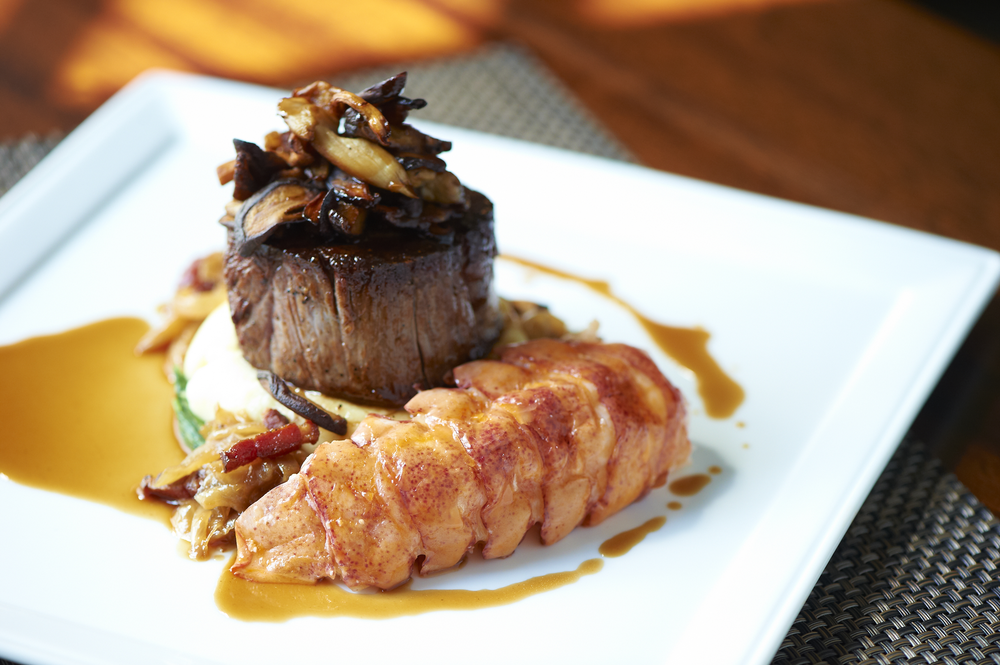

In [1]:
from IPython.display import Image
Image("restaurant-food-cost-control.jpg")

In [2]:
#importing all the necessary library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#import warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
#loading train and test data
test= pd.read_excel('Data_test.xlsx')
train= pd.read_excel('Data_train.xlsx')

In [4]:
# checking first 5 rows of test data
test.head()

,TITLE,RESTAURANT_ID,CUISINES,TIME,CITY,LOCALITY,RATING,VOTES
0,CASUAL DINING,4085,"North Indian, Chinese, Mughlai, Kebab",12noon – 12midnight (Mon-Sun),Noida,Sector 18,4.3,564 votes
1,QUICK BITES,12680,"South Indian, Fast Food, Pizza, North Indian",7am – 12:30AM (Mon-Sun),Mumbai,Grant Road,4.2,61 votes
2,CASUAL DINING,1411,"North Indian, Seafood, Biryani, Chinese",11am – 11:30pm (Mon-Sun),Mumbai,Marine Lines,3.8,350 votes
3,None,204,Biryani,"9am – 10pm (Mon, Wed, Thu, Fri, Sat, Sun), 10:...",Faridabad,NIT,3.8,1445 votes
4,QUICK BITES,13453,"South Indian, Kerala",11am – 10pm (Mon-Sun),Kochi,Kaloor,3.6,23 votes


In [5]:
# checking first 5 rows of train data
train.head()

,TITLE,RESTAURANT_ID,CUISINES,TIME,CITY,LOCALITY,RATING,VOTES,COST
0,CASUAL DINING,9438,"Malwani, Goan, North Indian","11am – 4pm, 7:30pm – 11:30pm (Mon-Sun)",Thane,Dombivali East,3.6,49 votes,1200
1,"CASUAL DINING,BAR",13198,"Asian, Modern Indian, Japanese",6pm – 11pm (Mon-Sun),Chennai,Ramapuram,4.2,30 votes,1500
2,CASUAL DINING,10915,"North Indian, Chinese, Biryani, Hyderabadi","11am – 3:30pm, 7pm – 11pm (Mon-Sun)",Chennai,Saligramam,3.8,221 votes,800
3,QUICK BITES,6346,"Tibetan, Chinese",11:30am – 1am (Mon-Sun),Mumbai,Bandra West,4.1,24 votes,800
4,DESSERT PARLOR,15387,Desserts,11am – 1am (Mon-Sun),Mumbai,Lower Parel,3.8,165 votes,300


In [6]:
# lets save the data with source column so that we can easily distinguish between test and train data
train['source']='train'
test['source']='test'
test['COST']= 0
df=pd.concat([test,train],ignore_index=True)
print(train.shape,test.shape,df.shape)

(12690, 10) (4231, 10) (16921, 10)


In [7]:
df.dtypes

TITLE            object
RESTAURANT_ID     int64
CUISINES         object
TIME             object
CITY             object
LOCALITY         object
RATING           object
VOTES            object
source           object
COST              int64
dtype: object

In [8]:
#lets check the null value
df.isnull().sum()

TITLE               0
RESTAURANT_ID       0
CUISINES            0
TIME                0
CITY              147
LOCALITY          128
RATING              4
VOTES            1606
source              0
COST                0
dtype: int64

In [9]:
#lets fill the null value with most frequent value.
col= ['CITY','LOCALITY','RATING','VOTES']
from sklearn.impute import SimpleImputer
imp=SimpleImputer(strategy='most_frequent')
for i in col:
    df[i]=imp.fit_transform(df[i].values.reshape(-1,1))

In [10]:
#we can observe that there is no null value present in our data set.
df.isnull().sum()

TITLE            0
RESTAURANT_ID    0
CUISINES         0
TIME             0
CITY             0
LOCALITY         0
RATING           0
VOTES            0
source           0
COST             0
dtype: int64

In [11]:
# lets keep a copy of my data set
data=df.copy()

In [12]:
# lets load the data and try to observe what more we can grasp for wrangle the data
df.head()

,TITLE,RESTAURANT_ID,CUISINES,TIME,CITY,LOCALITY,RATING,VOTES,source,COST
0,CASUAL DINING,4085,"North Indian, Chinese, Mughlai, Kebab",12noon – 12midnight (Mon-Sun),Noida,Sector 18,4.3,564 votes,test,0
1,QUICK BITES,12680,"South Indian, Fast Food, Pizza, North Indian",7am – 12:30AM (Mon-Sun),Mumbai,Grant Road,4.2,61 votes,test,0
2,CASUAL DINING,1411,"North Indian, Seafood, Biryani, Chinese",11am – 11:30pm (Mon-Sun),Mumbai,Marine Lines,3.8,350 votes,test,0
3,None,204,Biryani,"9am – 10pm (Mon, Wed, Thu, Fri, Sat, Sun), 10:...",Faridabad,NIT,3.8,1445 votes,test,0
4,QUICK BITES,13453,"South Indian, Kerala",11am – 10pm (Mon-Sun),Kochi,Kaloor,3.6,23 votes,test,0


In [13]:
#lets see the object data type columns and see thier unique values.
for column in df.columns:
    if df[column].dtypes == 'object':
        print(str(column)+  '  :  ' +str(df[column].unique()))
        print(df[column].value_counts())
        print('*****************************************************************************************')
        print('\n')

TITLE  :  ['CASUAL DINING' 'QUICK BITES' 'None' 'FOOD TRUCK,DESSERT PARLOR'
 'DESSERT PARLOR,QUICK BITES' 'CASUAL DINING,BAR' 'LOUNGE' 'BEVERAGE SHOP'
 'CASUAL DINING,PUB' 'DESSERT PARLOR' 'PUB' 'CAFÉ' 'BAKERY' 'LOUNGE,BAR'
 'BAKERY,QUICK BITES' 'SWEET SHOP' 'SWEET SHOP,QUICK BITES'
 'BEVERAGE SHOP,QUICK BITES' 'CAFÉ,QUICK BITES' 'DHABA'
 'QUICK BITES,DESSERT PARLOR' 'FINE DINING' 'IRANI CAFE,BAKERY'
 'PUB,CASUAL DINING' 'BAKERY,CASUAL DINING' 'BAR' 'FOOD COURT'
 'QUICK BITES,SWEET SHOP' 'CAFÉ,BAR' 'BAR,PUB' 'BAKERY,DESSERT PARLOR'
 'KIOSK' 'CAFÉ,BAKERY' 'CASUAL DINING,BAKERY' 'BAKERY,CAFÉ'
 'CASUAL DINING,CAFÉ' 'QUICK BITES,CAFÉ' 'MESS' 'BAR,CASUAL DINING'
 'BEVERAGE SHOP,CAFÉ' 'BEVERAGE SHOP,DESSERT PARLOR' 'PUB,FINE DINING'
 'CASUAL DINING,FOOD COURT' 'CAFÉ,CASUAL DINING' 'LOUNGE,CASUAL DINING'
 'DESSERT PARLOR,CAFÉ' 'FINE DINING,BAR' 'CASUAL DINING,SWEET SHOP'
 'LOUNGE,FINE DINING' 'MICROBREWERY,PUB' 'FOOD TRUCK'
 'CASUAL DINING,MICROBREWERY' 'CLUB' 'CAFÉ,FOOD COURT'
 'CAFÉ,DESSERT

In [14]:
#lets explore TITLE column, by taking column data and later we can replace it with concated data.
df['TITLE'].value_counts()
#we can observe that total 123 types of title there but mostly repeted with same data with diffrent name

QUICK BITES                     5634
CASUAL DINING                   4910
None                            1287
CAFÉ                             830
DESSERT PARLOR                   508
                                ... 
CONFECTIONERY,QUICK BITES          1
KIOSK,FOOD COURT                   1
CAFÉ,FINE DINING                   1
CASUAL DINING,DESSERT PARLOR       1
BEVERAGE SHOP,FOOD COURT           1
Name: TITLE, Length: 123, dtype: int64

In [15]:
# lets split the title data
df['TITLE']=df['TITLE'].str.split(',')
type(df['TITLE'])

pandas.core.series.Series

In [16]:
type(df['TITLE'][0])

list

In [17]:
# lets seperate the data and take that data into a list
df1=[]
for i in range(df.shape[0]):
    for j in df['TITLE'][i]:
        df1.append(j)

In [18]:
list_1=list(set(df1))
list_1

['KIOSK',
 'FOOD COURT',
 'COCKTAIL BAR',
 'QUICK BITES',
 'CLUB',
 'CAFÉ',
 'MICROBREWERY',
 'PAAN SHOP',
 'FOOD TRUCK',
 'PUB',
 'BAKERY',
 'CASUAL DINING',
 'BEVERAGE SHOP',
 'MESS',
 'None',
 'FINE DINING',
 'DESSERT PARLOR',
 'CONFECTIONERY',
 'DHABA',
 'BHOJANALYA',
 'LOUNGE',
 'MEAT SHOP',
 'SWEET SHOP',
 'IRANI CAFE',
 'BAR']

# Reference: doing above step by taking the reference from

    read://https_towardsdatascience.com/?url=https%3A%2F%2Ftowardsdatascience.com%2Fsplitting-the-text-column-and-getting-unique-values-in-python-367a9548d085

In [19]:
# as we have seperated the data lets fill the data with correct names by replacing it with wrong names, by fuzzy wuzzy
# rference: read://https_towardsdatascience.com/?url=https%3A%2F%2Ftowardsdatascience.com%2Fsplitting-the-text-column-and-getting-unique-values-in-python-367a9548d085

In [20]:
from fuzzywuzzy import process
 
title_array=[]
def match_names(repeated_names,new_names):
    for row in repeated_names:
        x=process.extractOne(row, new_names)
        if x[1]<60:
            title_array.append('title')
        else:
            title_array.append(x[0])
    return title_array
  
#repeated titles names 

new_names=['IRANI CAFE',
 'None',
 'MEAT SHOP',
 'CONFECTIONERY',
 'MICROBREWERY',
 'DESSERT PARLOR',
 'SWEET SHOP',
 'CAFÉ',
 'QUICK BITES',
 'BEVERAGE SHOP',
 'FOOD COURT',
 'CASUAL DINING',
 'DHABA',
 'BHOJANALYA',
 'COCKTAIL BAR',
 'BAKERY',
 'PUB',
 'BAR',
 'FINE DINING',
 'CLUB',
 'FOOD TRUCK',
 'KIOSK',
 'PAAN SHOP',
 'MESS',
 'LOUNGE' ]
name_match=match_names(data.TITLE,new_names)    

print(len(title_array))
data['TITLE']=title_array

16921


In [21]:
# we can observe below the TITLE column, and we can check the unique names thats its been reduce and we can do the visualisation .
data['TITLE'].unique()

array(['CASUAL DINING', 'QUICK BITES', 'None', 'DESSERT PARLOR', 'LOUNGE',
       'BEVERAGE SHOP', 'PUB', 'CAFÉ', 'BAKERY', 'BAR', 'SWEET SHOP',
       'DHABA', 'FINE DINING', 'IRANI CAFE', 'FOOD COURT', 'KIOSK',
       'MESS', 'MICROBREWERY', 'FOOD TRUCK', 'CLUB', 'MEAT SHOP',
       'CONFECTIONERY', 'PAAN SHOP', 'BHOJANALYA', 'COCKTAIL BAR'],
      dtype=object)

In [22]:
data.head()

,TITLE,RESTAURANT_ID,CUISINES,TIME,CITY,LOCALITY,RATING,VOTES,source,COST
0,CASUAL DINING,4085,"North Indian, Chinese, Mughlai, Kebab",12noon – 12midnight (Mon-Sun),Noida,Sector 18,4.3,564 votes,test,0
1,QUICK BITES,12680,"South Indian, Fast Food, Pizza, North Indian",7am – 12:30AM (Mon-Sun),Mumbai,Grant Road,4.2,61 votes,test,0
2,CASUAL DINING,1411,"North Indian, Seafood, Biryani, Chinese",11am – 11:30pm (Mon-Sun),Mumbai,Marine Lines,3.8,350 votes,test,0
3,None,204,Biryani,"9am – 10pm (Mon, Wed, Thu, Fri, Sat, Sun), 10:...",Faridabad,NIT,3.8,1445 votes,test,0
4,QUICK BITES,13453,"South Indian, Kerala",11am – 10pm (Mon-Sun),Kochi,Kaloor,3.6,23 votes,test,0


In [23]:
#lets concat both city and locality together.
data['Location']=data['CITY']+' '+data['LOCALITY']
data.drop(columns=['CITY','LOCALITY'],inplace=True)

In [24]:
# we can observe that we have seperated the location in column by concating 
data.head()

,TITLE,RESTAURANT_ID,CUISINES,TIME,RATING,VOTES,source,COST,Location
0,CASUAL DINING,4085,"North Indian, Chinese, Mughlai, Kebab",12noon – 12midnight (Mon-Sun),4.3,564 votes,test,0,Noida Sector 18
1,QUICK BITES,12680,"South Indian, Fast Food, Pizza, North Indian",7am – 12:30AM (Mon-Sun),4.2,61 votes,test,0,Mumbai Grant Road
2,CASUAL DINING,1411,"North Indian, Seafood, Biryani, Chinese",11am – 11:30pm (Mon-Sun),3.8,350 votes,test,0,Mumbai Marine Lines
3,None,204,Biryani,"9am – 10pm (Mon, Wed, Thu, Fri, Sat, Sun), 10:...",3.8,1445 votes,test,0,Faridabad NIT
4,QUICK BITES,13453,"South Indian, Kerala",11am – 10pm (Mon-Sun),3.6,23 votes,test,0,Kochi Kaloor


In [25]:
# lets use fuzzywuzzy and try replace wrong_names with correct names.
from fuzzywuzzy import process
 
names_array=[]
def match_names(wrong_names,correct_names):
    for row in wrong_names:
        x=process.extractOne(row, correct_names)
        if x[1]<50:
            names_array.append('others')
        else:
            names_array.append(x[0])
    return names_array
  
#correct loction names dataset

correct_names=['Bangalore','Thane',
'Hyderabad','Andheri',
'Delhi', 'Kerala',
'Chennai', 'Bandra',
'Mumbai', 'Telangana',
'Kochi', 
'Noida', 
'Gurgaon', 'Ernakulam',
'Faridabad', 'Ghaziabad',
'Secunderabad' ]
name_match=match_names(data.Location,correct_names)    

print(len(names_array))
data['Location']=names_array

16921


In [26]:
data

,TITLE,RESTAURANT_ID,CUISINES,TIME,RATING,VOTES,source,COST,Location
0,CASUAL DINING,4085,"North Indian, Chinese, Mughlai, Kebab",12noon – 12midnight (Mon-Sun),4.3,564 votes,test,0,Noida
1,QUICK BITES,12680,"South Indian, Fast Food, Pizza, North Indian",7am – 12:30AM (Mon-Sun),4.2,61 votes,test,0,Mumbai
2,CASUAL DINING,1411,"North Indian, Seafood, Biryani, Chinese",11am – 11:30pm (Mon-Sun),3.8,350 votes,test,0,Mumbai
3,None,204,Biryani,"9am – 10pm (Mon, Wed, Thu, Fri, Sat, Sun), 10:...",3.8,1445 votes,test,0,Faridabad
4,QUICK BITES,13453,"South Indian, Kerala",11am – 10pm (Mon-Sun),3.6,23 votes,test,0,Kochi
...,...,...,...,...,...,...,...,...,...
16916,QUICK BITES,13228,"North Indian, Burger, Kebab","12noon – 12midnight (Mon, Tue, Wed, Thu, Sun)...",3.8,546 votes,train,500,Hyderabad
16917,CASUAL DINING,9686,"Goan, Continental","12noon – 1am (Mon-Fri),11am – 5pm, 7pm – 1am...",4.3,1214 votes,train,1800,Bandra
16918,LOUNGE,11133,"Finger Food, Continental, Asian, Chinese",12noon – 12:30AM (Mon-Sun),4.0,608 votes,train,1300,Mumbai
16919,CASUAL DINING,6134,"North Indian, South Indian, Chinese, Street Food",6am – 10:45pm (Mon-Sun),3.5,32 votes,train,400,Chennai


In [27]:
#before mving further lets explore column and try to delete the alphabetical value.
#lets delete the alpha value from Votes column and make the dtype int.
data['VOTES'].replace(regex=True, inplace=True, to_replace=r'[^0-9.\-]', value=r'')
data['VOTES'] = data['VOTES'].astype('int')

In [28]:
#Above we can observe that my rating column consist of '-' nd 'new' lets replace it mean rating.
data['RATING'] = data["RATING"].replace("-", np.NaN)
data['RATING'] = data["RATING"].replace("NEW", np.NaN)
data['RATING'] = data['RATING'].astype('float64')
data['RATING']=data['RATING'].apply(lambda x:round(x,2))# lets round the columns.
data['RATING'].fillna(data['RATING'].mode().values[0], inplace=True)

In [29]:
#lets observe the dtypes again
data.dtypes

TITLE             object
RESTAURANT_ID      int64
CUISINES          object
TIME              object
RATING           float64
VOTES              int32
source            object
COST               int64
Location          object
dtype: object

In [30]:
#lets check the unique data from all the columns again.
#lets see the object data type columns and see thier unique values.
for column in data.columns:
    if data[column].dtypes == 'object':
        print(str(column)+  '  :  ' +str(data[column].unique()))
        print(data[column].value_counts())
        print('*****************************************************************************************')
        print('\n')

TITLE  :  ['CASUAL DINING' 'QUICK BITES' 'None' 'DESSERT PARLOR' 'LOUNGE'
 'BEVERAGE SHOP' 'PUB' 'CAFÉ' 'BAKERY' 'BAR' 'SWEET SHOP' 'DHABA'
 'FINE DINING' 'IRANI CAFE' 'FOOD COURT' 'KIOSK' 'MESS' 'MICROBREWERY'
 'FOOD TRUCK' 'CLUB' 'MEAT SHOP' 'CONFECTIONERY' 'PAAN SHOP' 'BHOJANALYA'
 'COCKTAIL BAR']
QUICK BITES       5928
CASUAL DINING     5796
None              1287
CAFÉ               924
DESSERT PARLOR     795
FINE DINING        467
BAKERY             392
BEVERAGE SHOP      228
SWEET SHOP         201
BAR                172
LOUNGE             136
FOOD COURT         115
MICROBREWERY        98
PUB                 90
KIOSK               73
MESS                68
DHABA               61
FOOD TRUCK          37
CLUB                29
CONFECTIONERY        6
PAAN SHOP            5
IRANI CAFE           5
MEAT SHOP            4
COCKTAIL BAR         3
BHOJANALYA           1
Name: TITLE, dtype: int64
*****************************************************************************************


CUISI

# summary statistics

In [31]:
data.describe()

,RESTAURANT_ID,RATING,VOTES,COST
count,16921.000000,16921.000000,16921.000000,16921.000000
mean,7767.211631,3.795438,383.583949,491.410141
std,4493.287626,0.405681,806.592316,612.654286
min,0.000000,2.000000,3.000000,0.000000
25%,3873.000000,3.600000,44.000000,0.000000
50%,7751.000000,3.900000,133.000000,350.000000
75%,11672.000000,4.000000,409.000000,600.000000
max,15573.000000,4.900000,41186.000000,14000.000000


<AxesSubplot:>

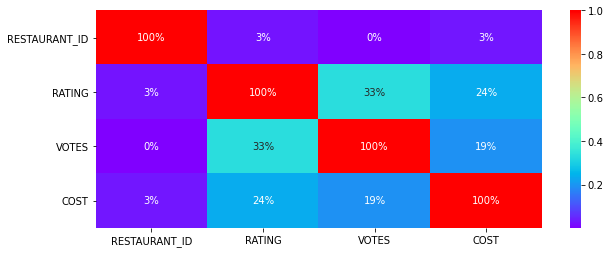

In [32]:
plt.figure(figsize=(10,4))
sns.heatmap(data.corr(),annot=True,fmt='.0%',cmap='rainbow')

Text(0.5, 1.0, 'Corelation with Target variables')

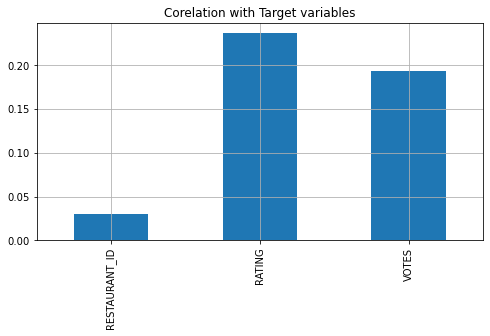

In [33]:
plt.figure(figsize=(8,4))
data.drop('COST',axis=1).corrwith(data['COST']).plot(kind='bar',grid=True)
plt.title('Corelation with Target variables')

# Univariate Analysis.

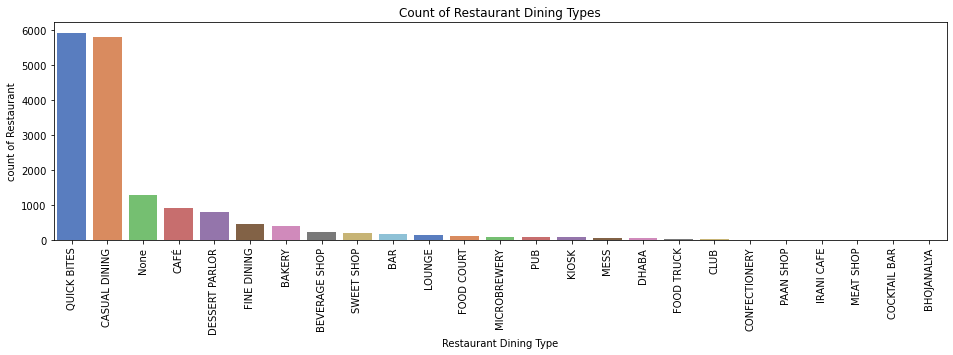

QUICK BITES       5928
CASUAL DINING     5796
None              1287
CAFÉ               924
DESSERT PARLOR     795
FINE DINING        467
BAKERY             392
BEVERAGE SHOP      228
SWEET SHOP         201
BAR                172
LOUNGE             136
FOOD COURT         115
MICROBREWERY        98
PUB                 90
KIOSK               73
MESS                68
DHABA               61
FOOD TRUCK          37
CLUB                29
CONFECTIONERY        6
PAAN SHOP            5
IRANI CAFE           5
MEAT SHOP            4
COCKTAIL BAR         3
BHOJANALYA           1
Name: TITLE, dtype: int64


In [34]:
plt.subplots(figsize=(16,4))
sns.countplot(x='TITLE',data=data,palette='muted',order= data['TITLE'].value_counts().index)
plt.title('Count of Restaurant Dining Types')
plt.xlabel('Restaurant Dining Type')
plt.ylabel('count of Restaurant')
plt.xticks(rotation=90)
plt.show()
print(data['TITLE'].value_counts())

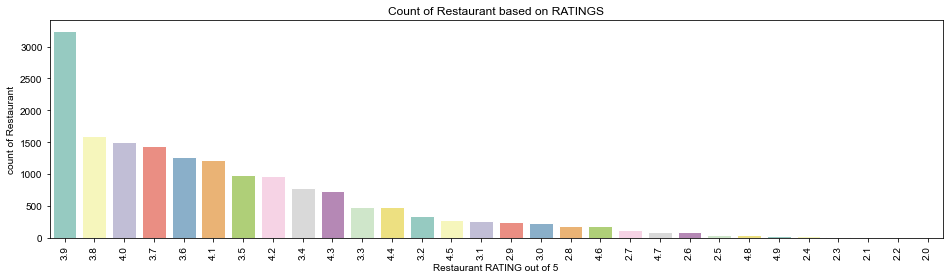

3.9    3249
3.8    1604
4.0    1498
3.7    1437
3.6    1261
4.1    1217
3.5     988
4.2     968
3.4     777
4.3     740
3.3     485
4.4     484
3.2     349
4.5     274
3.1     263
2.9     242
3.0     229
2.8     191
4.6     184
2.7     129
4.7      90
2.6      85
2.5      51
4.8      49
4.9      28
2.4      24
2.3      15
2.1       4
2.2       4
2.0       2
Name: RATING, dtype: int64


In [35]:
plt.subplots(figsize=(16,4))
sns.set(style='darkgrid')
sns.countplot(x='RATING',data=data,palette='Set3',order= data['RATING'].value_counts().index)
plt.title('Count of Restaurant based on RATINGS')
plt.xlabel('Restaurant RATING out of 5')
plt.ylabel('count of Restaurant')
plt.xticks(rotation=90)
plt.show()
print(data['RATING'].value_counts())

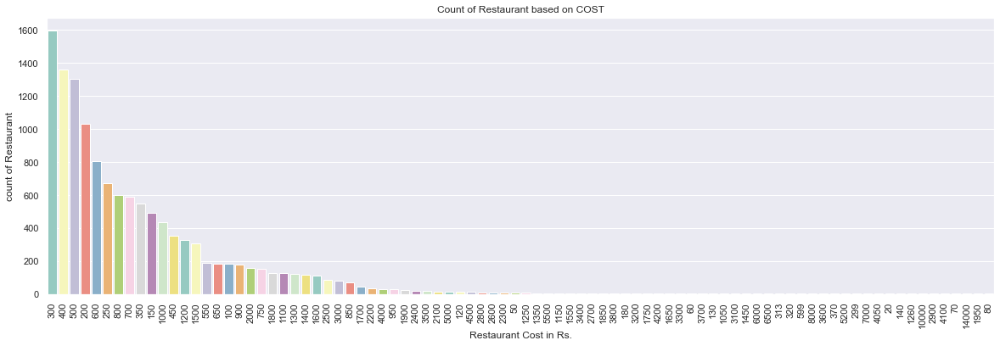

300      1595
400      1357
500      1300
200      1031
600       806
         ... 
4100        1
70          1
14000       1
1950        1
80          1
Name: COST, Length: 86, dtype: int64


In [36]:
plt.subplots(figsize=(20,6))
sns.set(style='darkgrid')
sns.countplot(x='COST',data=train,palette='Set3',order= train['COST'].value_counts().index)
plt.title('Count of Restaurant based on COST')
plt.xlabel('Restaurant Cost in Rs.')
plt.ylabel('count of Restaurant')
plt.xticks(rotation=90)
plt.show()
print(train['COST'].value_counts())

observation:
    1. we can witness the maximum cost by the resaturant is Rs 14000 which is 1 in number. 
    2. we can also witness the minimum cost by the resaturant is Rs 20 which is 1 in number. 
    3. we can observe that the maximum restaurant cost is Rs 300 for 1595 restaurant.

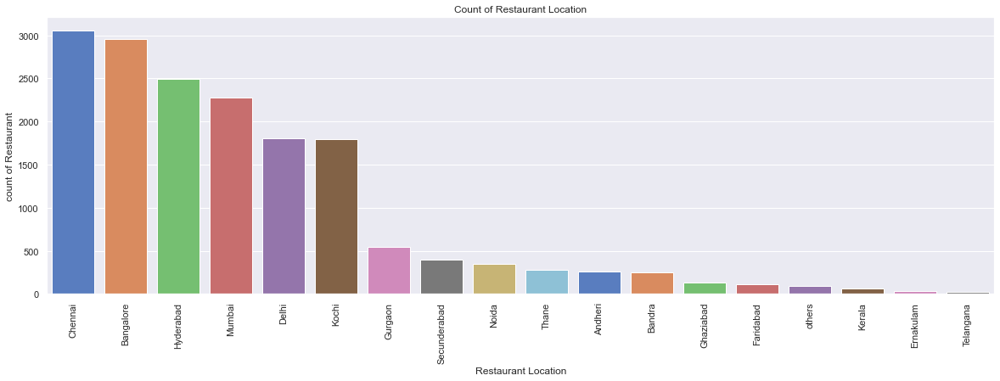

Chennai         3057
Bangalore       2961
Hyderabad       2498
Mumbai          2275
Delhi           1807
Kochi           1791
Gurgaon          543
Secunderabad     402
Noida            345
Thane            284
Andheri          256
Bandra           249
Ghaziabad        133
Faridabad        114
others            91
Kerala            60
Ernakulam         34
Telangana         21
Name: Location, dtype: int64


In [37]:
plt.subplots(figsize=(20,6))
sns.set(style='darkgrid')
sns.countplot(x='Location',data=data,palette='muted',order= data['Location'].value_counts().index)
plt.title('Count of Restaurant Location')
plt.xlabel('Restaurant Location')
plt.ylabel('count of Restaurant')
plt.xticks(rotation=90)
plt.show()
print(data['Location'].value_counts())

# Bivariate Analysis.

# Restaurant Dining mean cost vs COST

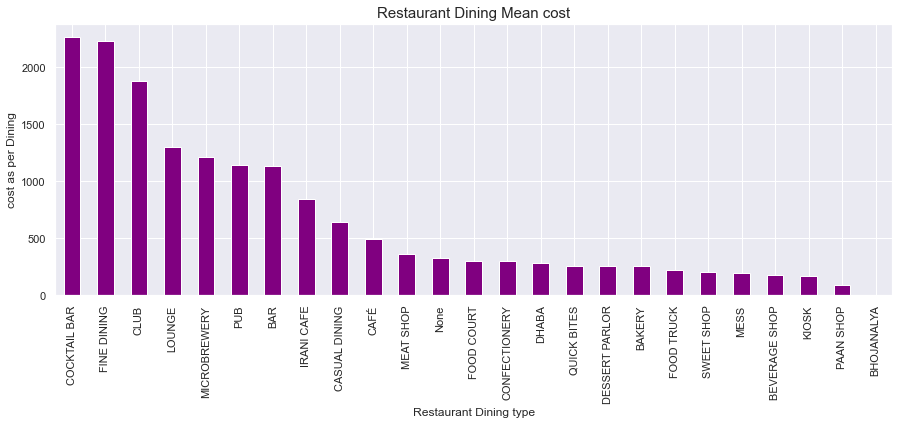

,COST
TITLE,
COCKTAIL BAR,2266.666667
FINE DINING,2229.871520
CLUB,1879.310345
LOUNGE,1295.220588
MICROBREWERY,1211.734694
PUB,1138.888889
BAR,1133.720930
IRANI CAFE,840.000000
CASUAL DINING,641.895963


In [38]:
plt.subplots(figsize=(18,4))
data.groupby('TITLE')['COST'].mean().sort_values(ascending=False).plot(kind="bar",figsize=(15,5),color='purple')
plt.title("Restaurant Dining Mean cost", fontsize=15)
plt.xlabel('Restaurant Dining type')
plt.ylabel('cost as per Dining')
plt.show()
pd.DataFrame(data.groupby('TITLE')['COST'].mean().sort_values(ascending=False))

# Total earning by the Restaurant on thier types of DINING irrespective of Location

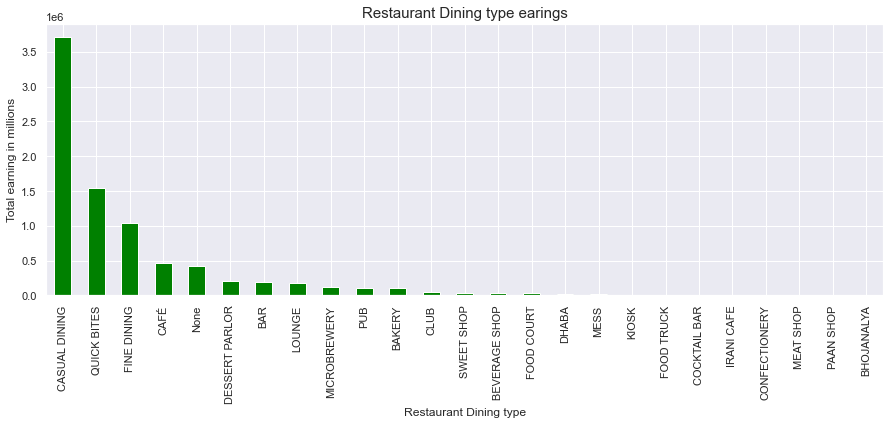

,COST
TITLE,
CASUAL DINING,3720429
QUICK BITES,1544773
FINE DINING,1041350
CAFÉ,459150
None,416800
DESSERT PARLOR,203820
BAR,195000
LOUNGE,176150
MICROBREWERY,118750


In [39]:
plt.subplots(figsize=(18,4))
data.groupby('TITLE')['COST'].sum().sort_values(ascending=False).plot(kind="bar",figsize=(15,5),color='green')
plt.title("Restaurant Dining type earings", fontsize=15)
plt.xlabel('Restaurant Dining type')
plt.ylabel('Total earning in millions')
plt.show()
pd.DataFrame(data.groupby('TITLE')['COST'].sum().sort_values(ascending=False))

In [40]:
data.columns

Index(['TITLE', 'RESTAURANT_ID', 'CUISINES', 'TIME', 'RATING', 'VOTES',
       'source', 'COST', 'Location'],
      dtype='object')

# Ratings vs cost

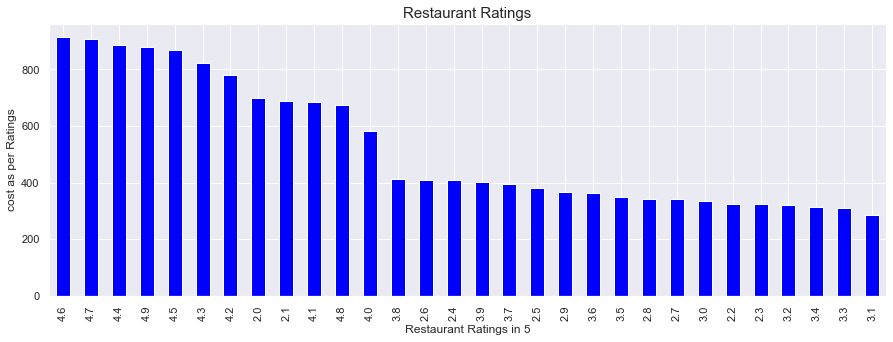

,COST
RATING,
4.6,914.673913
4.7,908.333333
4.4,884.855372
4.9,880.357143
4.5,869.890511
4.3,824.067568
4.2,779.752066
2.0,700.000000
2.1,687.500000


In [41]:
plt.subplots(figsize=(18,4))
data.groupby('RATING')['COST'].mean().sort_values(ascending=False).plot(kind="bar",figsize=(15,5),color='blue')
plt.title("Restaurant Ratings", fontsize=15)
plt.xlabel('Restaurant Ratings in 5')
plt.ylabel('cost as per Ratings')
plt.show()
pd.DataFrame(data.groupby('RATING')['COST'].mean().sort_values(ascending=False))

# Total earning By restaurant on basis of ratings.

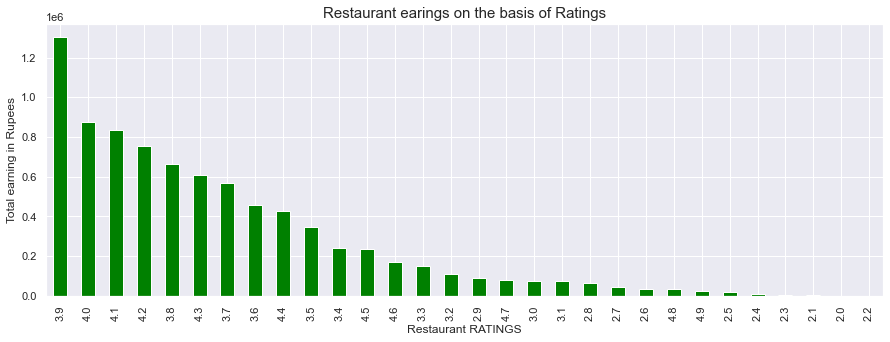

,COST
RATING,
3.9,1302940
4.0,873510
4.1,833150
4.2,754800
3.8,664029
4.3,609810
3.7,568130
3.6,457520
4.4,428270


In [42]:
plt.subplots(figsize=(18,4))
data.groupby('RATING')['COST'].sum().sort_values(ascending=False).plot(kind="bar",figsize=(15,5),color='green')
plt.title("Restaurant earings on the basis of Ratings", fontsize=15)
plt.xlabel('Restaurant RATINGS')
plt.ylabel('Total earning in Rupees')
plt.show()
pd.DataFrame(data.groupby('RATING')['COST'].sum().sort_values(ascending=False))

In [43]:
data.columns

Index(['TITLE', 'RESTAURANT_ID', 'CUISINES', 'TIME', 'RATING', 'VOTES',
       'source', 'COST', 'Location'],
      dtype='object')

# Location vs cost

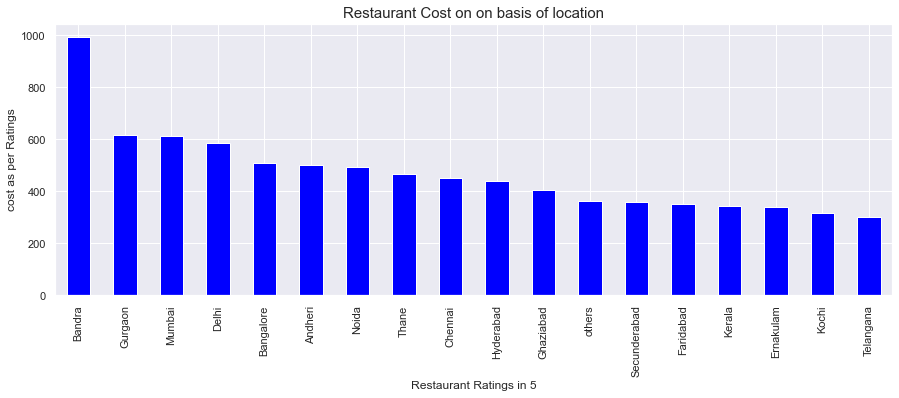

,COST
Location,
Bandra,993.775100
Gurgaon,615.101289
Mumbai,613.201319
Delhi,584.737133
Bangalore,507.145897
Andheri,500.781250
Noida,494.634783
Thane,464.366197
Chennai,449.653255


In [44]:
plt.subplots(figsize=(18,4))
data.groupby('Location')['COST'].mean().sort_values(ascending=False).plot(kind="bar",figsize=(15,5),color='blue')
plt.title("Restaurant Cost on on basis of location", fontsize=15)
plt.xlabel('Restaurant Ratings in 5')
plt.ylabel('cost as per Ratings')
plt.show()
pd.DataFrame(data.groupby('Location')['COST'].mean().sort_values(ascending=False))

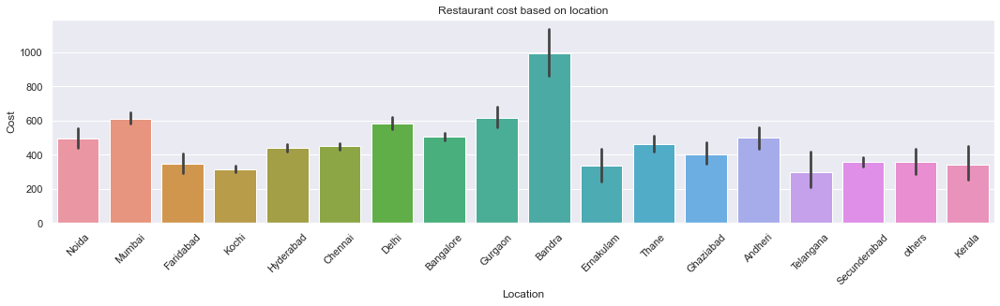

In [45]:
plt.subplots(figsize=(18,4))
sns.barplot(x='Location',y='COST',data=data)
plt.title('Restaurant cost based on location')
plt.xlabel('Location')
plt.ylabel('Cost')
plt.xticks(rotation=45)
plt.show()

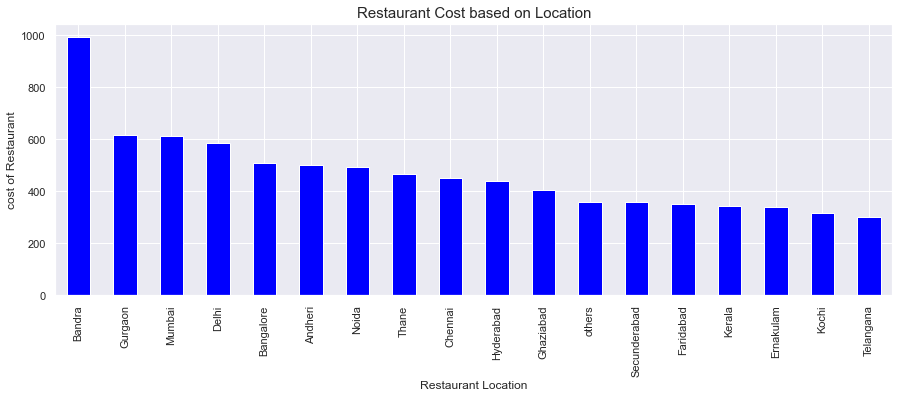

,COST
Location,
Bandra,993.775100
Gurgaon,615.101289
Mumbai,613.201319
Delhi,584.737133
Bangalore,507.145897
Andheri,500.781250
Noida,494.634783
Thane,464.366197
Chennai,449.653255


In [46]:
plt.subplots(figsize=(18,4))
data.groupby('Location')['COST'].mean().sort_values(ascending=False).plot(kind="bar",figsize=(15,5),color='blue')
plt.title("Restaurant Cost based on Location", fontsize=15)
plt.xlabel('Restaurant Location')
plt.ylabel('cost of Restaurant')
plt.show()
pd.DataFrame(data.groupby('Location')['COST'].mean().sort_values(ascending=False))

# Total earnings of restaurant based on their location

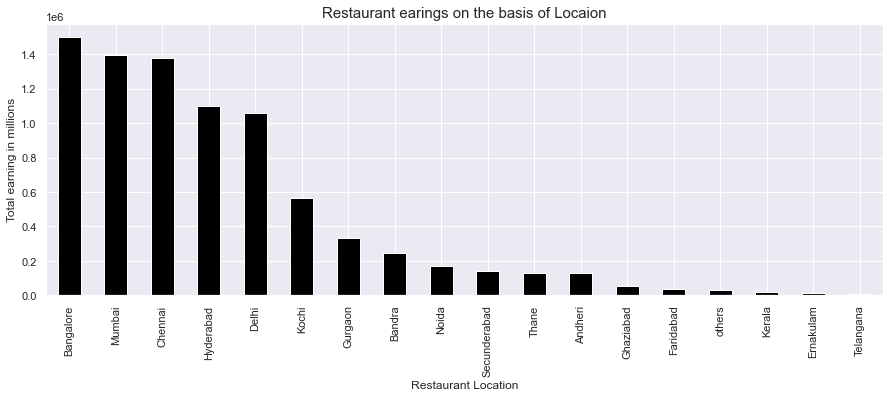

,COST
Location,
Bangalore,1501659
Mumbai,1395033
Chennai,1374590
Hyderabad,1100280
Delhi,1056620
Kochi,566570
Gurgaon,334000
Bandra,247450
Noida,170649


In [47]:
plt.subplots(figsize=(18,4))
data.groupby('Location')['COST'].sum().sort_values(ascending=False).plot(kind="bar",figsize=(15,5),color='black')
plt.title("Restaurant earings on the basis of Locaion", fontsize=15)
plt.xlabel('Restaurant Location')
plt.ylabel('Total earning in millions')
plt.show()
pd.DataFrame(data.groupby('Location')['COST'].sum().sort_values(ascending=False))

# Lets check the votes as per DINING type and Location.

In [48]:
import plotly.express as px
# lets seperate Votes according DINING Types.
title_votes = pd.DataFrame(data.groupby('TITLE')['VOTES'].sum())
title_votes['TITLE'] = title_votes.index
title_votes.index = np.arange(1,26) 
title_votes = title_votes[['TITLE','VOTES']]


In [49]:
# I am plotting Dining and given vote.
fig = px.bar(title_votes.sort_values('VOTES',ascending=False)[:25][::-1],x='VOTES',y='TITLE',title='Restaurant Dining Type and votes',text='VOTES', height=800, orientation='h')
fig.show()

In [50]:
# lets seperate Votes according location.
location_votes = pd.DataFrame(data.groupby('Location')['VOTES'].sum())
location_votes['Location'] = location_votes.index
location_votes.index = np.arange(1,19) 
location_votes = location_votes[['Location','VOTES']]

In [51]:
# I am plotting location and given votes.
fig = px.bar(location_votes.sort_values('VOTES',ascending=False)[:25][::-1],x='VOTES',y='Location',title='Restaurant Location and votes',text='VOTES', height=800, orientation='h')
fig.show()

# Lets start the process for model building

In [52]:
data.head()

,TITLE,RESTAURANT_ID,CUISINES,TIME,RATING,VOTES,source,COST,Location
0,CASUAL DINING,4085,"North Indian, Chinese, Mughlai, Kebab",12noon – 12midnight (Mon-Sun),4.3,564,test,0,Noida
1,QUICK BITES,12680,"South Indian, Fast Food, Pizza, North Indian",7am – 12:30AM (Mon-Sun),4.2,61,test,0,Mumbai
2,CASUAL DINING,1411,"North Indian, Seafood, Biryani, Chinese",11am – 11:30pm (Mon-Sun),3.8,350,test,0,Mumbai
3,None,204,Biryani,"9am – 10pm (Mon, Wed, Thu, Fri, Sat, Sun), 10:...",3.8,1445,test,0,Faridabad
4,QUICK BITES,13453,"South Indian, Kerala",11am – 10pm (Mon-Sun),3.6,23,test,0,Kochi


In [53]:
# we hve categorised the test and train data with source column lets drop the test data
data['source'].value_counts()

train    12690
test      4231
Name: source, dtype: int64

In [54]:
#lets frop the test data
data.drop(data.index[:4231],inplace=True)
#lets reset the index
data.reset_index(drop=True,inplace=True)

In [55]:
#we have dropped the test data now we have only train data with us.
data.drop(columns=['source','CUISINES','TIME'],inplace=True)

In [56]:
# lets use label encoder and convert the categorical column into numeric.
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
mod=['TITLE','Location']
for i in mod:
    data[i] = le.fit_transform(data[i])

In [57]:
data

,TITLE,RESTAURANT_ID,RATING,VOTES,COST,Location
0,4,9438,3.6,49,1200,16
1,4,13198,4.2,30,1500,3
2,4,10915,3.8,221,800,3
3,22,6346,4.1,24,800,1
4,8,15387,3.8,165,300,12
...,...,...,...,...,...,...
12685,22,13228,3.8,546,500,9
12686,4,9686,4.3,1214,1800,1
12687,15,11133,4.0,608,1300,12
12688,4,6134,3.5,32,400,3


# To check distribution of skewness

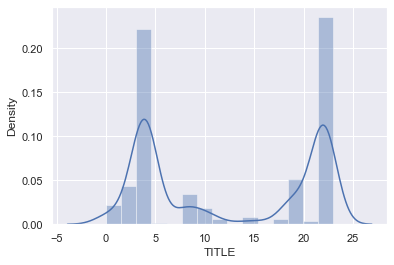

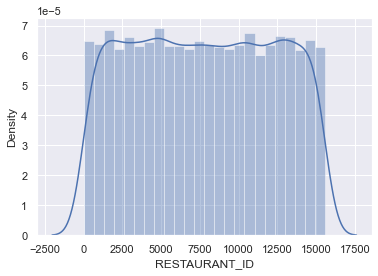

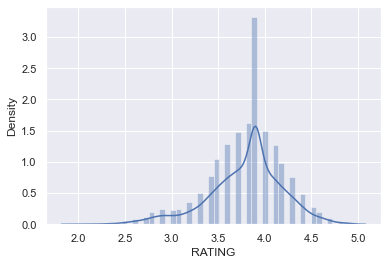

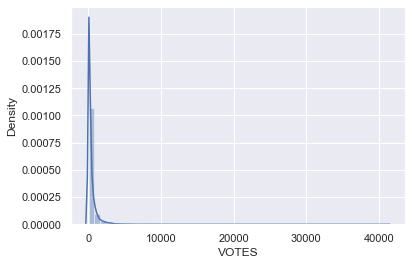

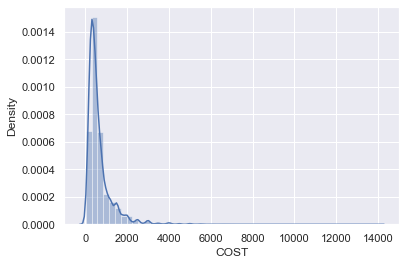

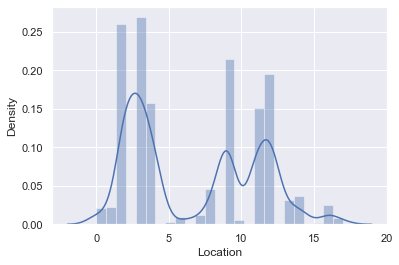

In [58]:
for i in data.columns:
    sns.distplot(data[i])
    plt.show()

In [59]:
# Now let check the skewness and try to remove the skewness.
data.skew()
#observation: we can oberve the data is skewed.

TITLE             0.074350
RESTAURANT_ID     0.006947
RATING           -0.610531
VOTES            14.609221
COST              3.978801
Location          0.278937
dtype: float64

In [60]:
# lets apply log transformation and treat the skewed data
for col in data.columns:
    if data.skew().loc[col]>0.55:
        data[col]=np.sqrt(data[col])

In [61]:
data.skew()

TITLE            0.074350
RESTAURANT_ID    0.006947
RATING          -0.610531
VOTES            2.287606
COST             1.641138
Location         0.278937
dtype: float64

# Removing Outliers

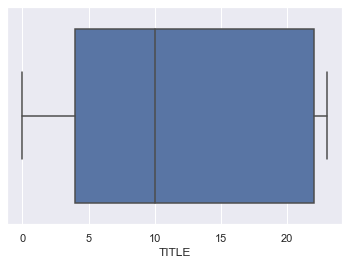

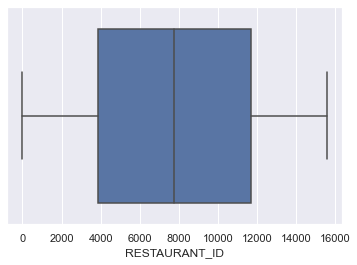

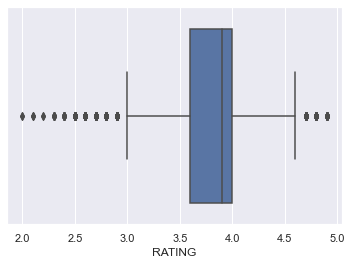

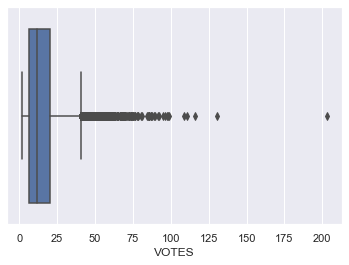

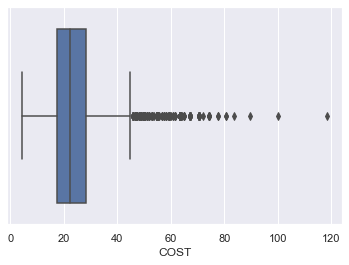

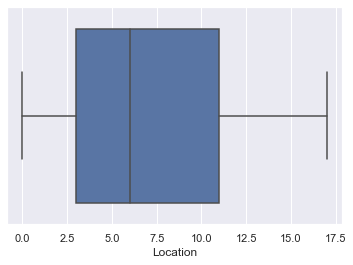

In [62]:
#lets plot the boxplot to identify the outliers.
for i in data.columns:
    sns.boxplot(data[i])
    plt.show()

In [63]:
#lets remove the outliers using zscore
from scipy.stats import zscore
z=abs(zscore(data))
print(data.shape)
new=data.loc[(z<3).all(axis=1)]
print(new.shape)
# we can observe the new zscore down below.

(12690, 6)
(12186, 6)


# Model Training

As we can observe in this data set , that we have to predict the Food Cost by taking target variable as COST.


# Lets apply various regression to predict the Deaths.

In [64]:
# lets sepearate input output columns
df_x=new.drop(columns=['COST']) # Input variable.
y=pd.DataFrame(new['COST']) #Target Variable.

In [65]:
# lets scale the input variable
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(df_x)
x=pd.DataFrame(x,columns=df_x.columns)
x.head()
# WE CAN NOTICE OUR DATA IS BEEN SCALED.

,TITLE,RESTAURANT_ID,RATING,VOTES,Location
0,-0.971032,0.375167,-0.489008,-0.736038,2.102787
1,-0.971032,1.210957,1.067557,-0.889313,-0.867780
2,-0.971032,0.703481,0.029847,0.055719,-0.867780
3,1.105397,-0.312137,0.808130,-0.947516,-1.324790
4,-0.509603,1.697537,0.029847,-0.147688,1.188767


In [66]:
#lets again check the skewness
x.skew()

TITLE            0.043150
RESTAURANT_ID    0.012009
RATING          -0.512004
VOTES            1.293405
Location         0.276762
dtype: float64

In [67]:
# let import diffrent model library
from sklearn.linear_model import LinearRegression,Lasso,ElasticNet,Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
#import ensemble technique
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor



#importing error matrics
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [68]:
#lets apply regression to datasets
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import train_test_split
def maxr2_score(regr,x,y): #Def is used such that we can call it later
    max_r_score=0
    for r_state in range(42,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=r_state,test_size=0.20)
        regr.fit(x_train,y_train)
        y_pred=regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print()
    print('max r2 score correponding to',final_r_state,'is',max_r_score)
    print()
    print('Error:')
    print('Mean absolute error:',mean_absolute_error(y_test,y_pred))
    print('Mean Squared error:',mean_squared_error(y_test,y_pred))
    print('Root Mean Squared error:',np.sqrt(mean_squared_error(y_test,y_pred)))
    print('*******************************************************************')
    print()
    return final_r_state

In [69]:
model=[LinearRegression(),Lasso(),KNeighborsRegressor(),SVR(),DecisionTreeRegressor(),GradientBoostingRegressor(),RandomForestRegressor(),Ridge(),ElasticNet(),AdaBoostRegressor()]
for m in model:
    print('----->>',m,'<<-----')
    r_state=maxr2_score(m,x,y)

----->> LinearRegression() <<-----

max r2 score correponding to 49 is 0.3697865336751045

Error:
Mean absolute error: 4.865070832688487
Mean Squared error: 43.94267631951426
Root Mean Squared error: 6.628927237458129
*******************************************************************

----->> Lasso() <<-----

max r2 score correponding to 75 is 0.33315373704879847

Error:
Mean absolute error: 4.992833959432473
Mean Squared error: 46.498940552139516
Root Mean Squared error: 6.819013165564319
*******************************************************************

----->> KNeighborsRegressor() <<-----

max r2 score correponding to 57 is 0.3614342626382999

Error:
Mean absolute error: 4.967748312440817
Mean Squared error: 45.98000245683272
Root Mean Squared error: 6.780855584425369
*******************************************************************

----->> SVR() <<-----

max r2 score correponding to 88 is 0.39644339811221063

Error:
Mean absolute error: 4.6750260223074545
Mean Squared error:

In [70]:
#lets cross validate all the model uing FOR loop.
from sklearn.model_selection import cross_val_score
model=[LinearRegression(),Lasso(),KNeighborsRegressor(),SVR(),DecisionTreeRegressor(),GradientBoostingRegressor(),RandomForestRegressor(),Ridge(),ElasticNet(),AdaBoostRegressor()]
for m in model:
    cvs=cross_val_score(m,x,y,cv=10,scoring='r2')
    print('Cross val score of',m,'is:')
    print('Cross val score is',cvs)
    print('Mean cross val score of',m,'is',cvs.mean())
    print('Standard deviation of',m,'is',cvs.std())
    print()
    print('*******************************************************************')

Cross val score of LinearRegression() is:
Cross val score is [0.35403306 0.33111913 0.3553995  0.34812098 0.3284534  0.36884552
 0.30813583 0.32463176 0.33309334 0.34737982]
Mean cross val score of LinearRegression() is 0.3399212344250538
Standard deviation of LinearRegression() is 0.017023189140232438

*******************************************************************
Cross val score of Lasso() is:
Cross val score is [0.31618857 0.30528219 0.32864863 0.31845613 0.30021103 0.32806724
 0.27959362 0.28960154 0.30236034 0.3130155 ]
Mean cross val score of Lasso() is 0.30814247853220766
Standard deviation of Lasso() is 0.015085363324621162

*******************************************************************
Cross val score of KNeighborsRegressor() is:
Cross val score is [0.35326267 0.31082696 0.33298179 0.31352916 0.3185888  0.36261752
 0.2896127  0.30062601 0.3049185  0.35765047]
Mean cross val score of KNeighborsRegressor() is 0.3244614598854172
Standard deviation of KNeighborsRegressor

In [71]:
# lets check the best parameter using grid search cv.
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')
gbr=GradientBoostingRegressor()
parameters={'learning_rate':[0.001,0.01,0.1,1],'n_estimators':[10,100,500,100]} 
clf=GridSearchCV(gbr,parameters,cv=5)
clf.fit(x,y)
clf.best_params_

{'learning_rate': 0.1, 'n_estimators': 500}

In [72]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=47,test_size=0.20)
gbr=GradientBoostingRegressor(learning_rate=0.1,n_estimators=500)
gbr.fit(x_train,y_train)
pred=gbr.predict(x_test)
print("R2 Score for Ridge : ",r2_score(y_test,pred)*100)
print('Cross Validation Score for Ridge: ',cross_val_score(gbr,x,y,cv=5,scoring='r2').mean()*100)
print()
print('Mean absolute error:',mean_absolute_error(y_test,pred))
print('Mean Squared error:',mean_squared_error(y_test,pred))
print('Root Mean Squared Error :',np.sqrt(mean_squared_error(y_test,pred)))

R2 Score for Ridge :  66.85033113143768
Cross Validation Score for Ridge:  64.68194887569639

Mean absolute error: 3.6367102897062535
Mean Squared error: 22.778553467776273
Root Mean Squared Error : 4.7726882852095285


In [73]:
#lets test the model
Food_cost=gbr.predict(x)

AxesSubplot(0.125,0.125;0.775x0.755)


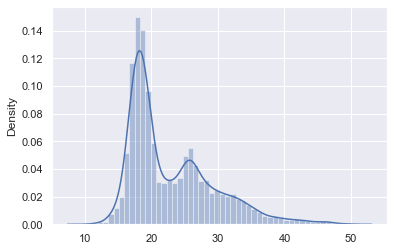

In [74]:
print(sns.distplot([Food_cost]))

In [75]:
#lets save the model with pickle
import joblib
joblib.dump(gbr,'food_cost.pkl')

['food_cost.pkl']

In [76]:
#lets save the predicted result to excel file.
ds=pd.DataFrame(Food_cost)
ds.to_csv('food_cost.csv')